First frame saved as 'first_frame.jpg'.


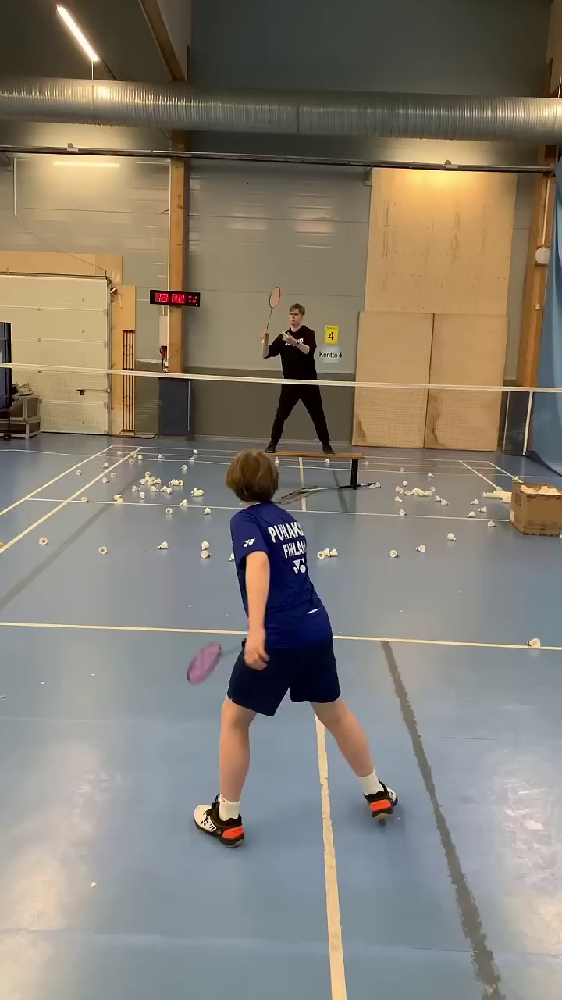

In [29]:
import cv2
from IPython.display import Image, display

# Update video path
video_path = 'BadmintonVideo2.mp4'
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error: Cannot open video.")
else:
    # Read the first frame
    ret, frame = cap.read()
    if ret:
        # Save the frame to disk
        cv2.imwrite('first_frame.jpg', frame)
        print("First frame saved as 'first_frame.jpg'.")
    else:
        print("Error: Cannot read frames from the video.")

cap.release()

# Display the saved frame
display(Image(filename='first_frame.jpg'))


In [53]:
start = (100,400)
end = (600,1000)
color = (255,0,0)
thickness = 2

In [54]:
import cv2
import mediapipe as mp

# Initialize Mediapipe Pose
mp_pose = mp.solutions.pose
pose = mp_pose.Pose()
mp_drawing = mp.solutions.drawing_utils

# Open the video file
video_path = 'BadmintonVideo2.mp4'
cap = cv2.VideoCapture(video_path)
results = []
# Set up video writer to save pose overlay video
output_path = 'pose_output.mp4'
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width, frame_height))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Convert frame to RGB
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Perform pose detection
    result = pose.process(rgb_frame)
    results.append(result)
    # Draw pose landmarks on the frame
    if result.pose_landmarks:
        cv2.rectangle(frame,start,end,color,thickness)
        mp_drawing.draw_landmarks(frame, result.pose_landmarks, mp_pose.POSE_CONNECTIONS)

    # Write the processed frame to the output video
    out.write(frame)

cap.release()
out.release()

print("Pose detection complete. Saved as 'pose_output.mp4'")


Pose detection complete. Saved as 'pose_output.mp4'


In [45]:
for result in results:
    for idx, landmark in enumerate(result.pose_landmarks.landmark):
            # print(f"Landmark {idx}: {landmark}")  # Print the whole landmark (x, y, z, visibility)
            # Print specific attributes
            # print(f"Landmark {idx} - x: {landmark.x*720}, y: {landmark.y* 1280}, z: {landmark.z}, visibility: {landmark.visibility}")
            if idx == 31:
                print(f"x: {int(landmark.x * 720)}, y: {int(landmark.y* 1280)}")

x: 254, y: 1038
x: 254, y: 1040
x: 254, y: 1041
x: 254, y: 1041
x: 254, y: 1041
x: 256, y: 1040
x: 256, y: 1040
x: 257, y: 1040
x: 258, y: 1038
x: 258, y: 1036
x: 259, y: 1035
x: 259, y: 1034
x: 260, y: 1033
x: 259, y: 1032
x: 258, y: 1032
x: 257, y: 1033
x: 255, y: 1033
x: 255, y: 1033
x: 255, y: 1033
x: 255, y: 1033
x: 257, y: 1033
x: 260, y: 1033
x: 262, y: 1034
x: 264, y: 1034
x: 267, y: 1033
x: 270, y: 1027
x: 277, y: 1018
x: 291, y: 1006
x: 308, y: 997
x: 350, y: 987
x: 368, y: 966
x: 413, y: 961
x: 449, y: 955
x: 486, y: 968
x: 502, y: 958
x: 532, y: 959
x: 569, y: 964
x: 595, y: 981
x: 616, y: 1007
x: 614, y: 1012
x: 613, y: 1014
x: 616, y: 1017
x: 612, y: 1018
x: 613, y: 1015
x: 618, y: 1016
x: 615, y: 1020
x: 608, y: 1017
x: 601, y: 1015
x: 573, y: 1014
x: 545, y: 1012
x: 515, y: 1000
x: 493, y: 989
x: 484, y: 981
x: 469, y: 976
x: 464, y: 977
x: 457, y: 981
x: 456, y: 981
x: 450, y: 994
x: 453, y: 1007
x: 461, y: 1018
x: 463, y: 1023
x: 462, y: 1027
x: 463, y: 1027
x: 464, y

In [37]:
len(results)

164

In [31]:
import numpy as np
h,w,_ = frame.shape
h,w

(1280, 720)

In [56]:
from IPython.display import Video
Video('pose_output.mp4', embed=True)


In [ ]:
import cv2
import mediapipe as mp
from IPython.display import Video

# Initialize Mediapipe Pose
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=False, model_complexity=2, enable_segmentation=False, min_detection_confidence=0.5)

# Initialize Mediapipe Drawing
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

# Open the video file
video_path = 'Badminton.mp4'
cap = cv2.VideoCapture(video_path)

# Set up video writer to save pose overlay video
output_path = 'pose_3d_output.mp4'
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width, frame_height))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Convert frame to RGB
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Perform pose detection
    result = pose.process(rgb_frame)

    # Draw 2D and 3D pose landmarks on the frame
    if result.pose_landmarks:
        # Draw 2D pose landmarks
        mp_drawing.draw_landmarks(
            frame,
            result.pose_landmarks,
            mp_pose.POSE_CONNECTIONS,
            landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style()
        )
        # Optionally: Extract and print 3D landmarks
        print(result.pose_world_landmarks)  # This contains 3D landmark coordinates

    # Write the processed frame to the output video
    out.write(frame)

cap.release()
out.release()
print("3D pose estimation complete. Saved as 'pose_3d_output.mp4'")

# Display the video in Colab
Video('pose_3d_output.mp4', embed=True)


Streaming output truncated to the last 5000 lines.
  x: -0.238223284
  y: 0.621824145
  z: 0.174436957
  visibility: 0.938676894
}
landmark {
  x: 0.0846290514
  y: 0.727642238
  z: -0.0871035084
  visibility: 0.967053652
}
landmark {
  x: -0.225009739
  y: 0.670989275
  z: 0.221586809
  visibility: 0.678878427
}
landmark {
  x: 0.160123095
  y: 0.758654
  z: -0.0902091
  visibility: 0.875514925
}

landmark {
  x: 0.101010315
  y: -0.62729
  z: 0.100597024
  visibility: 0.99866271
}
landmark {
  x: 0.0933935344
  y: -0.643806636
  z: 0.0742244646
  visibility: 0.998116612
}
landmark {
  x: 0.0944469795
  y: -0.642337203
  z: 0.0842678845
  visibility: 0.997321784
}
landmark {
  x: 0.0960942209
  y: -0.645709634
  z: 0.0801534
  visibility: 0.998048365
}
landmark {
  x: 0.131426811
  y: -0.650515616
  z: 0.0526178107
  visibility: 0.999128222
}
landmark {
  x: 0.136631414
  y: -0.649200082
  z: 0.0376331322
  visibility: 0.999259412
}
landmark {
  x: 0.139173523
  y: -0.640280426
  z: 0

In [ ]:
from google.colab import files
files.download('pose_3d_output.mp4')



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import csv

# Save 3D pose landmarks to CSV
with open('pose_3d_landmarks.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Landmark', 'X', 'Y', 'Z'])
    for idx, landmark in enumerate(result.pose_world_landmarks.landmark):
        writer.writerow([idx, landmark.x, landmark.y, landmark.z])

print("3D landmarks saved as 'pose_3d_landmarks.csv'.")


3D landmarks saved as 'pose_3d_landmarks.csv'.


In [ ]:
import csv

# Open the video and CSV file
with open('pose_3d_landmarks.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Frame', 'Landmark', 'X', 'Y', 'Z'])  # Add frame column to header

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            print("End of video or cannot read the file.")
            break

        # Convert to RGB and process with Mediapipe
        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        result = pose.process(rgb_frame)

        # Write pose landmarks for this frame if available
        if result.pose_world_landmarks:
            for idx, landmark in enumerate(result.pose_world_landmarks.landmark):
                writer.writerow([frame_count, idx, landmark.x, landmark.y, landmark.z])

        frame_count += 1

print("3D landmarks for all frames saved as 'pose_3d_landmarks.csv'.")


3D landmarks for all frames saved as 'pose_3d_landmarks.csv'.


In [ ]:
from google.colab import files
files.download('pose_3d_landmarks.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

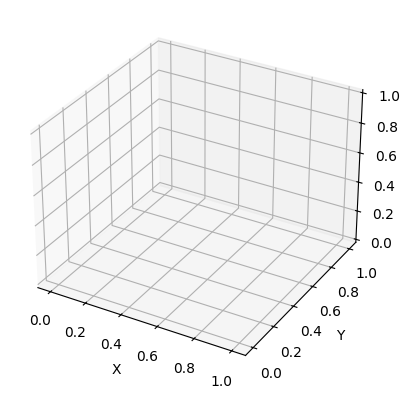

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Load the saved CSV
landmarks_df = pd.read_csv('pose_3d_landmarks.csv')

# Filter for a single frame (e.g., frame 0)
frame_0 = landmarks_df[landmarks_df['Frame'] == 0]

# Plot 3D landmarks
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(frame_0['X'], frame_0['Y'], frame_0['Z'])

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()


In [ ]:
import cv2
import mediapipe as mp

# Initialize Mediapipe Pose and Drawing utilities
mp_pose = mp.solutions.pose
mp_drawing = mp.solutions.drawing_utils

# Open the input video
video_path = "Badminton.mp4"
cap = cv2.VideoCapture(video_path)

# Get video properties
fps = int(cap.get(cv2.CAP_PROP_FPS))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
output_path = 'output_with_2d_landmarks.mp4'

# Define video writer
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for .mp4 files
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

# Process the video
with mp_pose.Pose(static_image_mode=False, model_complexity=1) as pose:
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Convert the frame to RGB (as Mediapipe works with RGB images)
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        result = pose.process(frame_rgb)

        # Draw the landmarks on the frame
        if result.pose_landmarks:
            mp_drawing.draw_landmarks(frame, result.pose_landmarks, mp_pose.POSE_CONNECTIONS)

        # Write the processed frame to the output video
        out.write(frame)

# Release resources
cap.release()
out.release()
print(f"Processed video saved as {output_path}")



Processed video saved as output_with_2d_landmarks.mp4


In [ ]:
from IPython.display import Video

# Display the output video
Video(output_path, embed=True)


In [ ]:
import csv

# Open the input video
cap = cv2.VideoCapture(video_path)

# Initialize Pose model
with mp_pose.Pose(static_image_mode=False, model_complexity=1) as pose:
    # Prepare a CSV file to save 3D landmarks
    with open('pose_3d_landmarks.csv', 'w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['Frame', 'Landmark', 'X', 'Y', 'Z'])  # Header for CSV

        frame_count = 0

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break

            # Convert the frame to RGB
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            result = pose.process(frame_rgb)

            # Save 3D landmarks if detected
            if result.pose_world_landmarks:
                for idx, landmark in enumerate(result.pose_world_landmarks.landmark):
                    writer.writerow([frame_count, idx, landmark.x, landmark.y, landmark.z])

            frame_count += 1

# Release the video capture object
cap.release()

print("3D pose landmarks saved to 'pose_3d_landmarks.csv'.")


3D pose landmarks saved to 'pose_3d_landmarks.csv'.


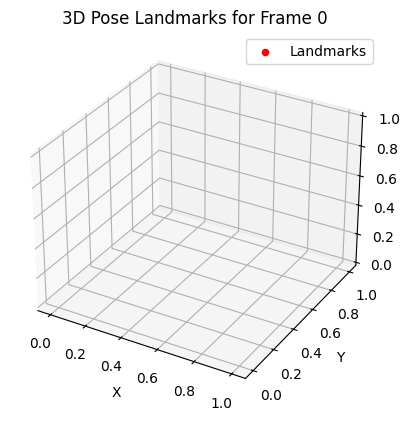

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Extract 3D landmarks for a single frame (e.g., frame 0)
frame_landmarks = []

with open('pose_3d_landmarks.csv', 'r') as file:
    reader = csv.reader(file)
    next(reader)  # Skip header
    for row in reader:
        if int(row[0]) == 0:  # Select frame 0
            frame_landmarks.append([float(row[2]), float(row[3]), float(row[4])])

# Separate X, Y, Z coordinates
x_vals = [l[0] for l in frame_landmarks]
y_vals = [l[1] for l in frame_landmarks]
z_vals = [l[2] for l in frame_landmarks]

# Plot 3D pose
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_vals, y_vals, z_vals, c='red', label='Landmarks')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title("3D Pose Landmarks for Frame 0")
plt.legend()
plt.show()


In [ ]:
# Court dimensions (adjust based on your video resolution)
court_top_left = (100, 50)    # Example top-left corner of the court in pixels
court_bottom_right = (500, 400)  # Example bottom-right corner in pixels


In [3]:
import cv2
import numpy as np
# from google.colab.patches import cv2_imshow  # Import cv2_imshow for Colab

# Define court rectangle
min_x, min_y = 180,245    # Example top-left corner of the court in pixels
max_x, max_y = 426,458   # Example bottom-right corner in pixels
court_color = (0, 255, 0)  # Green rectangle for court boundaries

# Load the video
cap = cv2.VideoCapture('BadmintonVideo2.mp4')

# Simple background subtraction for tracking
fgbg = cv2.createBackgroundSubtractorMOG2()

# Initialize video writer to save the output
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('shuttlecock_tracking.mp4', fourcc, cap.get(cv2.CAP_PROP_FPS),
                      (int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)), int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))))
# mask_out = cv2.VideoWriter('shuttlecock_mask_tracking.mp4', fourcc, cap.get(cv2.CAP_PROP_FPS),
#                       (int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)), int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))))
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Draw court boundaries
    cv2.rectangle(frame, (min_x,min_y), (max_x,max_y), (0,255,0), 2)
    # Apply background subtraction
    fgmask = fgbg.apply(frame)
    # Find contours for potential shuttlecock positions
    contours, _ = cv2.findContours(fgmask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # contours, _ = cv2.findContours(fgmask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    for cnt in contours:
        # Filter out small noise
        if cv2.contourArea(cnt) > 10:
            x, y, w, h = cv2.boundingRect(cnt)
            center = (x + w // 2, y + h // 2)
            print('x',min_x,x,max_x,'\n','y',min_y,y,max_y)
            if (0 <= x and 240 >= x) and (0 <= y and 210 >= y):
                print("In Bound")
                cv2.putText(frame, "In Bound", ((min_x+max_x)//2,(min_y+max_y)//2), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0), 2)
                cv2.rectangle(frame, (min_x,min_y), (max_x,max_y), (0,255,0), 2)

            else:
                print("Out of Bound")
                cv2.putText(frame, "Out of Bound", ((min_x+max_x)//2,(min_y+max_y)//2), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,255), 2)
                cv2.rectangle(frame, (min_x,min_y), (max_x,max_y), (0,0,255), 2)
                
                
            # # Check if shuttlecock is within court boundaries
            # if court_top_left[0] <= center[0] <= court_bottom_right[0] and \
            #    court_top_left[1] <= center[1] <= court_bottom_right[1]:
            #     color = (0, 255, 0)  # Green for in-bounds
            #     text = "In Bounds"
            # else:
            #     color = (0, 0, 255)  # Red for out-of-bounds
            #     text = "Out of Bounds"

            # Draw the shuttlecock and label
            # cv2.circle(frame, center, 5, color, -1)
            # cv2.putText(frame, text, (center[0] + 10, center[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

    # Save the frame to the output video
    out.write(frame)
    # mask_out.write(fgmask)
    # Display the frame inline in Colab

cap.release()
out.release()
# mask_out.release()
print("Processed video saved as 'shuttlecock_tracking.mp4'.")

x 180 0 426 
 y 245 0 458
In Bound
x 180 436 426 
 y 245 1188 458
Out of Bound
x 180 428 426 
 y 245 1095 458
Out of Bound
x 180 276 426 
 y 245 1056 458
Out of Bound
x 180 412 426 
 y 245 1041 458
Out of Bound
x 180 553 426 
 y 245 1039 458
Out of Bound
x 180 563 426 
 y 245 1035 458
Out of Bound
x 180 420 426 
 y 245 1017 458
Out of Bound
x 180 247 426 
 y 245 1012 458
Out of Bound
x 180 545 426 
 y 245 1008 458
Out of Bound
x 180 416 426 
 y 245 994 458
Out of Bound
x 180 282 426 
 y 245 994 458
Out of Bound
x 180 460 426 
 y 245 978 458
Out of Bound
x 180 297 426 
 y 245 929 458
Out of Bound
x 180 281 426 
 y 245 896 458
Out of Bound
x 180 440 426 
 y 245 894 458
Out of Bound
x 180 291 426 
 y 245 882 458
Out of Bound
x 180 344 426 
 y 245 828 458
Out of Bound
x 180 549 426 
 y 245 816 458
Out of Bound
x 180 317 426 
 y 245 812 458
Out of Bound
x 180 148 426 
 y 245 800 458
Out of Bound
x 180 112 426 
 y 245 800 458
Out of Bound
x 180 0 426 
 y 245 796 458
Out of Bound
x 180 499 42

In [ ]:
from IPython.display import Video

# Display the saved video
Video('advanced_shuttlecock_tracking.mp4', embed=True)
